[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Humboldt-WI/bads/blob/master/tutorials/10_nb_interpretale_ML.ipynb) 

# BADS - Interpretable Machine Learning

So far we have talked about topics such as data analysis, data preprocessing, feature engineering, as well as model estimation and evaluation. In this weeks tutorial of BADS we want to discuss how we can interpret our models, as the accuracy measure is often deemed as insufficient. Currently, many potent models are also very complex, and thus their decisions can be hard to follow for humans. This is also referred to as the interpretability vs. accuracy trade-off. <br>
Why does interpretability matter at all? When we decide whether or not someone will get a discount, making a wrong prediction can come with a fairly low cost. However, when we talk about medicine or banks giving out credits, the cost of classifying someone wrong becomes much higher. Therefore, accuracy is of great importance. On the other hand, we need to be able to verify these results to build trust in the model and to verify it with the use of domain knowledge. Furthermore, data regulations might demand insight into models, which is barely possible for complex models. <br>
Therefore, different techniques have been designed to estimate the decisions of black box models and make them interpretable. This chapter will discuss these methods, how you can learn to implement them and how to interpret the different plots. 
Let's begin!

## Preliminaries


### Import packages and data

In [60]:
# Import standard packages. We import specific packages later when we first need them.
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
%matplotlib inline


In [61]:
# Load the data for this tutorial directly from GitHub
data_url = 'https://raw.githubusercontent.com/Humboldt-WI/bads/master/data/hmeq_modeling.csv'

print('Fetching data...')
df = pd.read_csv(data_url)
df.info() 

Fetching data...
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5960 entries, 0 to 5959
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             5960 non-null   int64  
 1   BAD               5960 non-null   bool   
 2   LOAN              5960 non-null   float64
 3   MORTDUE           5960 non-null   float64
 4   VALUE             5960 non-null   float64
 5   YOJ               5960 non-null   float64
 6   CLAGE             5960 non-null   float64
 7   NINQ              5960 non-null   float64
 8   CLNO              5960 non-null   float64
 9   DEBTINC           5960 non-null   float64
 10  DEROGzero         5960 non-null   bool   
 11  REASON_HomeImp    5960 non-null   int64  
 12  REASON_IsMissing  5960 non-null   int64  
 13  JOB_Office        5960 non-null   int64  
 14  JOB_Other         5960 non-null   int64  
 15  JOB_ProfExe       5960 non-null   int64  
 16  JOB_Sales         5960 no

### Model development and evaluation

Many relevant modeling functions expect an input in the form $(y, X)$, where $y$ denotes the target variable and $X$ the covariates. We build these items from our prepared data frame and use them in the reminder.

In [63]:
y = df.BAD.values
X = df.iloc[:, 2:df.shape[1]].values
X_var_labels = df.columns[2:df.shape[1]]
y.shape, X.shape

((5960,), (5960, 18))

In [64]:
x = np.arange(5)
x * x

array([ 0,  1,  4,  9, 16])

In [65]:
X[0:3,1]

array([-1.2958822108106054, -0.013473612226342531, -1.654549200571461],
      dtype=object)

In [66]:
X[0:3,1]*X[0:3,1]

array([1.6793107042953823, 0.00018153822642584693, 2.7375330571116607],
      dtype=object)

In [67]:
X_var_labels

Index(['LOAN', 'MORTDUE', 'VALUE', 'YOJ', 'CLAGE', 'NINQ', 'CLNO', 'DEBTINC',
       'DEROGzero', 'REASON_HomeImp', 'REASON_IsMissing', 'JOB_Office',
       'JOB_Other', 'JOB_ProfExe', 'JOB_Sales', 'JOB_Self', 'DELINQcat_1',
       'DELINQcat_1+'],
      dtype='object')

In [68]:
# Data partitioning
from sklearn.model_selection import train_test_split

rnd_state = 888 
# create training and test set
# x_train = all columns but 'BAD' of training set (needed to build supervised learning model)
# y_train = outcome variable of training observations (needed to build supervised learning model)
# x_test = all columns but 'BAD' of test set (needed to predict outcome of test set with training set model)
# y_test = outcome variable of test observations (needed for model assessment)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = rnd_state)  # 30% of the data as hold-out

#make yourself familiar with these vectors
y_train.shape, X_train.shape, y_test.shape, X_test.shape

((4172,), (4172, 18), (1788,), (1788, 18))

In [69]:
# Train XGB model
from xgboost import XGBClassifier

xgb = XGBClassifier(
    max_depth=10, n_estimators=100,  eval_metric="logloss", learning_rate = 0.1, colsample_bytree = 0.7, use_label_encoder=False, random_state= rnd_state)
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, eval_metric='logloss',
              gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=888,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, use_label_encoder=False, verbosity=1)

In [70]:
# Build Random Forest Model
from sklearn.ensemble import RandomForestClassifier

# Train a model
rf = RandomForestClassifier(n_estimators=10, # Forest with n trees
                            max_depth=15, # and shallow
                            random_state = rnd_state) 
rf.fit(X_train, y_train)



RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=15, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=888,
                       verbose=0, warm_start=False)

## Feature importance analysis and model diagnosis

The interpretability of machine learning models is a big topic, because usually, the more complicated the model, the harder it will be to understand how our final predictions are computed. Especially for so called black-box models, methods have been develop to understand the importance of specific features in these models. 

### Skitlearn Feature Importance 

Most packages of models with decision trees as base learners implement a function for feature importance. This importance can be calculated for each decision tree, by the amount the performance of a model, e.g. with the Gini impurity measure,  improves through a split and is additionally weighted by the amount of observations this node splits. The importance that is calculated is finally averaged over all base learners in the model. 

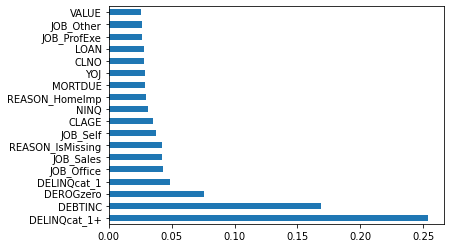

In [71]:
#Feature Importance XGBoost
feat_importances_xgb = pd.Series(xgb.feature_importances_, index= X_var_labels)
feat_importances_xgb.nlargest(20).plot(kind='barh')

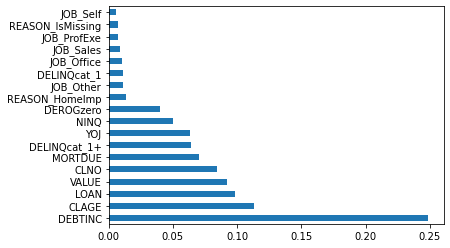

In [72]:
#Feature Importance RF
feat_importances_rf = pd.Series(rf.feature_importances_, index= X_var_labels)
feat_importances_rf.nlargest(20).plot(kind='barh')

**How to interpret these plots:** <br>
This plot depicts:
- the features on the y-axis
- their importance on the x-axis


*For example*, the feature DEBTINC shows a high importance for both models, with a vlaue of over 0.15 for the XGB model, and almost 0.25 for the RF model.

**When to use this plot:** <br>
This model is very useful to improve building our model. As you know, the more features we include in a model, the more it is possible for it to overfit. This plot shows us which features did not contribute much to the outcome of our predictions and might be better left out. However, this plot is also good to verify the decisions a model makes. We can check whether the features chosen as important by our model also are important in real life. For example, it makes a lot of sense that the debt to income ratio (DEBTINC) is of big importance to a bank, when deciding how likely a person is to pay back their loan.


### Permutation-based feature importance

Permutation-based feature importance is a learner-agnostic way to judge the relevance of features. It produces an ordinal feature ranking. In order to do this, we permute one variable by shuffling its values across all observations. This means, each observation will receive a new value. This permutation breaks the relationship to the target variable. Then we make an assumption: the higher the increase of the error due to the permutation, the more important this variable was in building the model. This way we can compute a ranking. 

Let's give it a try using our Random Forest model.

In [73]:
plt.rcParams['figure.figsize'] = 20, 10

# Permutation-based feature importance
print('Computing permutation-based feature importance...')
from sklearn.inspection import permutation_importance

classifier = xgb

perm_imp = permutation_importance(classifier, X_test, y_test, scoring='roc_auc', random_state=123)
sorted_idx = perm_imp.importances_mean.argsort()

Computing permutation-based feature importance...


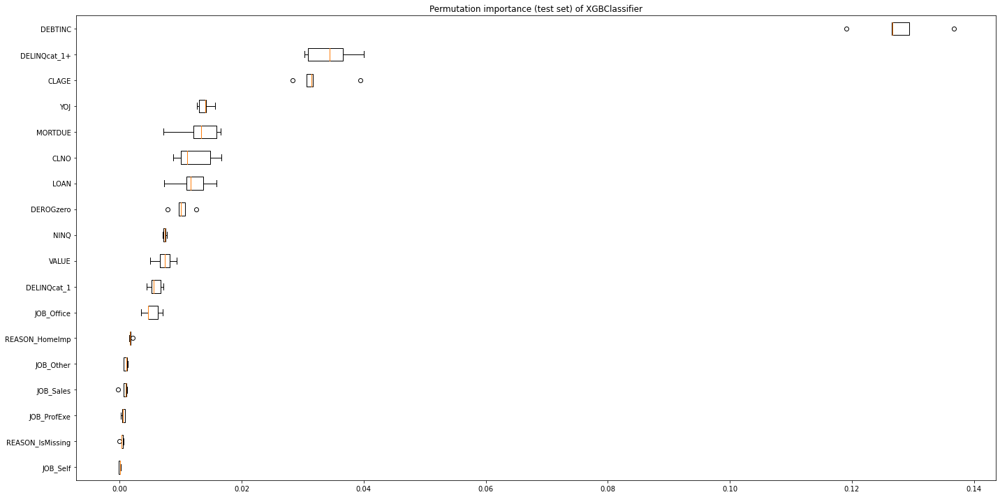

In [75]:
fig, ax = plt.subplots()
ax.boxplot(perm_imp.importances[sorted_idx].T,
           vert=False, labels=X_var_labels[sorted_idx])
ax.set_title("Permutation importance (test set) of {}".format(str(classifier)[0:str(classifier).find('(')]))
fig.tight_layout()
plt.show()

**How to interpret these plots:** <br>
This plot depicts:
- the features on the y-axis
- the permutation-based feature importance on the x-axis
- the corresponding box plots for each feature 

*For example*, DEBTINC is the highest on the importance ranking. We can identify some outliers on the boxplot, and the median being almost equal to the 25% quantile.

**When to use this plot:** <br>
This plot is helpful to identify a better picture of the feature importance, as you additionally get an impression of how their importance might vary. Furthermore, we can use it to verify our model. Again, the result agrees with domain knowledge. The debt-to-income ratio proves very important. RF devotes much attention to this feature so that permuting it increases the prediction error. High importance of the number of delinquent credit lines (DELINQ) also makes sense. For CLAGE (the age of the oldest credit line in months) it is maybe less obvious how it affects the target. Specifically, it would be useful to check whether high/lower values in this feature are associated with higher/lower default probability. We do not get such insight from permutation-based feature importance analysis. But partial-dependence should give as an answer.

## Partial dependence plot (PDP)
A PDP shows what type of effect a feature has on predicted probabilities. A PDP plots the values of a chosen variable (on the x-axis) against model-estimated probabilities (on the y-axis) whilst according for the combined effect of all other features. 

Computing partial dependence plots...


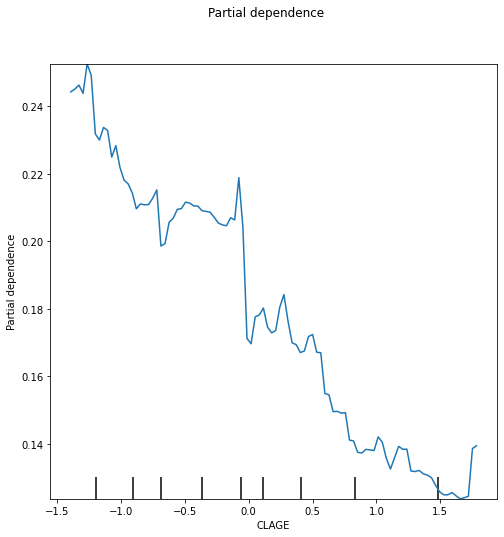

In [76]:
plt.rcParams['figure.figsize'] = 8,8
# Partial dependence
from sklearn.inspection import plot_partial_dependence
classifier = xgb
print('Computing partial dependence plots...')
plot_partial_dependence(classifier, X_train, features=['CLAGE'], feature_names=X_var_labels)

fig = plt.gcf()
fig.suptitle('Partial dependence')
fig.subplots_adjust(wspace=0.4, hspace=0.3)
plt.show()

**How to interpret these plots:** <br>
This plot depicts:
- the chosen variable on the x-axis
- the partial dependence/ effect of the chosen feature on the outcome

*For example*,
CLAGE shows to be decreasing the risk of default with increasing values the older the oldest credit line is. Remember that the values of this variable seem abstract as we standardized this variable during preprocessing, but high and low values are representative.

**When to use this plot:** <br>
This is the first plot to give us more insight on *how* a variable is affecting out output and analyses the relationship between the two. We can use this plot to verify not only if a feature is important, but the way our model uses this feature agrees with domain knowledge. 



## LIME
[Ribeiro et al. (2016)](https://doi.org/10.1145/2939672.2939778) first proposed a concrete implementation concept of LIME. LIME stands for Local Interpretable Model-Agnostic Explanation. Local stands for it explaining one particular observation. Model-agnostic means that it can be used on any model, as it only needs the input (data) and output (prediction) of any model to compute these explanations. This is useful as you can apply it to many models but also to many types of data, such as text and images. It uses the in- and output and additionally uses a simple explanation model, such as a decision tree, to explain the output. 
As a quick reminder, have a look at the pseudo code below that we discussed in the lecture.

**Pseudo Code for Lime**

```
0. Select your instance of interest (This is chosen first, however, if we want to define a general function, this will be an input parameter)
1. Perturb your dataset (synthetic data)
2. Get the black box predictions for these new samples 
3. Weight the new samples according to their proximity to the instance of interest
4. Train a weighted, interpretable model on the dataset with the variations
5. Explain the prediction by interpreting the local model
```

### LIME procedure
The LIME algorithm is implemented in the function `LIME_demo ()`. The function essentially consists of five steps.

#### 1. Synthetic data
Synthetic data is required to estimate the interpretable model. In this example, we use randomly selected normally distributed values. For each of the two features, the parameters of the normal distribution are specified according to the mean value and the standard deviation of this feature in the classification data.
#### 2. Prediction by BB model
A target variable is required for the interpretable model. For this purpose, we use the previously generated synthetic data as input to the trained BB model to make predictions. The target variable then corresponds to the estimate  $ \hat{p} \left( y_j=1|Z_j \right) $ by the BB model.

#### 3. Neighborhood and weighting
The synthetic data is weighted according to their distance to the test instance. We use the Euclidean distance $D\left(X_i,Z_j\right)=||X_i-Z_j||_2$. This is equal to the standard for structured data in the [official LIME package](https://github.com/marcotcr/lime). With the help of the calculating these distances, we define the test instance's neighborhood. Following the standard of the LIME package,  an exponential core function is used. 
$$ \pi_{X_i}\left( Z_i \right)=\exp \left( - \frac{D\left(X_i,Z_j\right)}{\sigma^2}\right)$$

#### 4. Estimation of the interpretable model
We use a linear model to explain the test instance's BB prediction. LIME uses a regularized linear model by default. In this example, as we only use two features, we don't make use of regularization and use a multivariate linear regression model for the interpretation, instead. We estimate this model by minimizing the * weighted * likelihood function.

$$ \mathcal{L} \left( f, g, \pi_{X_i} \right) = \sum_{j=1}^{J} \pi_{X_i}\left( Z_i \right) \left( f\left( Z_j \right)- g \left( Z_j \right)  \right)^2 $$

#### 5. Output of the results
The function provides various results, which stem from the paper by [Ribeiro et al. (2016)](https://doi.org/10.1145/2939672.2939778) and the [official LIME package](https://github.com/marcotcr/lime) This includes the prognosis of the test instance by the BB model as well as the interpretable model and a series of graphics that illustrate the functionality of LIME. For more details, please refer to the function's source code directly.


### LIME from scratch

#### Function `LIME_demo ()`

In [77]:
# Plotting
from matplotlib.colors import ListedColormap
from sklearn.datasets import make_moons
# Some configuration of the plots we will create later
%matplotlib inline  
class_coloring = plt.cm.bwr

# Machine learning
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import pairwise_distances
from sklearn.linear_model import Ridge, LinearRegression, LogisticRegression


import warnings
warnings.filterwarnings("ignore", message="numpy.dtype size changed")
warnings.filterwarnings("ignore", message="numpy.ufunc size changed")

In [78]:
def LIME_demo(X, y, test_point, BB_model, n_syn_data, kernel_width, rep_paper_plot=True, fname=None):
    """
    Simplified implementation of the LIME-method in accordance with Ribeiro et al. (2016)
    http://doi.org/10.1145/2939672.2939778
    
    Input parameters:  X = matrix of independent variables for the classification task 
                       y = vector of values of the target variable of the cases in X 

                       test_point = the instance to be explained
                       
                       BB_model = sklearn object of a trained classifier
                       
                       n_syn_data = number of synthetic data point (sample size) 
                       
                       kernel_width = parameters of the expoential core function

                       reg_paper_plot = boolean value. If true, the function outputs four plots
                                        based on the LIME paper. Otherwise an individualised 
                                        output consisting of six plots is generated.
                          
                                        
                      fname = Name of image file (path specification possible) the plots should
                              be saved as.If <None> no file will be saved.
    
    Author: Stefan Lessmann (stefan.lessmann@hu-berlin.de)
    
    License: BSD 2-clause "Simplified" license 
    
    Version: Januar 2021
    """    
    # *******************************************************************************************
    # 
    # Step 1: Generate synthetic data
    # 
    # *******************************************************************************************
    # For tabular data the proximity to the test instance is irrelevant at this point. The data
    # is generated as random, normally distributed values. The two features are uncorrelated.
    np.random_state = rnd_state
    X_syn = np.random.normal(loc=0, scale=1, size=n_syn_data*2).reshape(n_syn_data, 2) # Normally distributed random variable
    # Scaling of the corresponding data
    X_syn = X_syn * np.std(X, axis=0) + np.mean(X, axis=0)
    # Update of the scaling of the coordinate system for graphic representations
    xy_limits = plot_get_limits( np.row_stack((X, X_syn)), delta=0)  
    # *******************************************************************************************
    # 
    # Step 2: Predicting the synthetic data with the BB model to obtain a target variable for 
    #         the explanatory model
    # *******************************************************************************************
    y_syn = BB_model.predict_proba(X_syn)[:,1]
    # *******************************************************************************************
    # 
    # Step 3: Determine the distance between the test instance and the synthetic data points.
    #         This is how the neighborhood is estimated.  
    # 
    # *******************************************************************************************
    dist = pairwise_distances(X_syn, test_point).ravel()  # Pairwise distance to test instance
    weights = np.sqrt( np.exp(-(dist ** 2) / kernel_width ** 2))  # Neighborhood
    # *******************************************************************************************
    # 
    # Step 4: Estimate the linear interpretable model on the synthetic data. Since there are only 
    #         two features, we do not regularize the linear regression model.
    # 
    # *******************************************************************************************
    lin_reg = LinearRegression(fit_intercept=True)   
    WB_model = lin_reg.fit(X_syn, y_syn, sample_weight=weights)  # Min. weighted LL-function
    y_wb_syn = WB_model.predict(X_syn)  # Prediction of interpretable model
    resid = y_syn - y_wb_syn            # and the residuals
    # *******************************************************************************************
    # 
    # Step 5: Output of the results
    # 
    # *******************************************************************************************   
    # Textual summary
    print('Test instance: ', test_point)
    print('Parameter of the WB model: ', WB_model.coef_.ravel(), WB_model.intercept_)
    print('Weighted squared residual = {:.4}'.format(np.sum((resid**2)*weights)/len(y_syn)))
    print('Prediction of test instance of the BB model {}'.format(BB_model.predict_proba(test_point)[:,1]))
    print('Approximation of WB model {}'.format(WB_model.predict(test_point)))
    print('\n\n')
    #--------------------------------------------------------------------------------------------
    # Visiualization
    #--------------------------------------------------------------------------------------------
    if rep_paper_plot:
        plot_reproduce_paper(test_point, syn_x=X_syn, syn_weights=weights, bb_model=BB_model, wb_model=WB_model, img_name=fname)
    else:
        plot_lime_steps(test_point, X, y, syn_x=X_syn, syn_y=y_syn, syn_weights=weights, bb_model=BB_model, wb_model=WB_model, img_name=fname)

#### Functions for plotting

In [79]:
def plot_get_limits(D, delta=0.25):
    x1_lim = (np.min(D[:,0])-delta, np.max(D[:,0])+delta)
    x2_lim = (np.min(D[:,1])-delta, np.max(D[:,1])+delta)
    
    return (x1_lim, x2_lim)

In [80]:
def plot_init_axis(ax, title=None):
    
    if not title is None:
        ax.set_title(title, fontsize=16)
    ax.set_xlim(xy_limits[0][0], xy_limits[0][1])
    ax.set_ylim(xy_limits[1][0], xy_limits[1][1])
    ax.set_ylabel('$x_2$', fontsize=14)
    ax.set_xlabel('$x_1$', fontsize=14)

In [81]:
def plot_reg_line(ax, beta, bias, lw=5):
    # Plotting data
    x1 = np.linspace(xy_limits[0][0], xy_limits[0][1]) 
    x2 = - beta[0] / beta[1] * x1 - bias/beta[1]
    # Clipping
    ix = [i>xy_limits[1][0] and i < xy_limits[1][1] for i in x2]
    #ix = [i>x2_lim[0] and i < x2_lim[1] for i in x2]
    reg_line = np.c_[x1[ix], x2[ix]]
    # Plotting
    ax.plot(reg_line[:,0], reg_line[:,1], linewidth=lw, c='#FFFF00')
    return reg_line

In [82]:
def plot_data(ax, X, y, alpha=1, X_test=None, y_test=None):
    """ 2D plot of classification task"""
   
    # Plot the training & test points
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap=class_coloring, edgecolors='k', marker='o', alpha=alpha)
    #ax.set_xlabel("$x_1$")
    #ax.set_ylabel("$x_2$")
    if X_test is not None and y_test is not None:
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=class_coloring, edgecolors='k', marker='*', s=150, alpha=alpha)

In [83]:
def plot_synthetic(ax, X, y=None, weight=None, add_bar=False):
    """ 2D plot of classification task"""
    
    a = 0.7

    if y is None:
        ax.scatter(X[:,0], X[:,1], marker='^', c='k', s=weight, alpha=a)
    else:
        ax.scatter(X[:, 0], X[:, 1], c=y, cmap=class_coloring, edgecolors='k', marker='^', s=weight, alpha=a)

    if add_bar:
        ax_c = plt.colorbar(plt.cm.ScalarMappable(cmap=class_coloring))
        ax_c.set_label("BB-Modell estimate of $p(y=1|X)$")
        ax_c.set_ticks([0, .25, .5, .75, 1])
        

In [84]:
def mesh_grid_orig(model, res = 0.01, mode='classification'):
    res = 0.01 # step size in the mesh
   
    xx, yy = np.meshgrid( np.arange(xy_limits[0][0], xy_limits[0][1], res),
                          np.arange(xy_limits[1][0], xy_limits[1][1], res)
                        )   
    if mode == 'classification':
        y_hat = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
    elif mode =='regression':
        y_hat = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    else:
        raise(BaseException('The mode {} is not supported.'.format(mode)))
    y_hat = y_hat.reshape(xx.shape)
    return (xx, yy, y_hat)

In [85]:
def mesh_grid_data(res = 0.01):
    
    xx, yy = np.meshgrid( np.arange(xy_limits[0][0], xy_limits[0][1], res),
                          np.arange(xy_limits[1][0], xy_limits[1][1], res)
                        )   
    
    return (xx, yy)

In [86]:
def mesh_grid_prediction(model, res = 0.01, mode='classification'):
   
    data = mesh_grid_data(res)
    
    if mode == 'classification':
        y_hat = clf.predict_proba(np.c_[data[0].ravel(), data[1].ravel()])[:, 1]
    elif mode =='regression':
        y_hat = clf.predict(np.c_[data[0].ravel(), data[1].ravel()])
    else:
        raise(BaseException('The mode {} is not supported.'.format(mode)))
    y_hat = y_hat.reshape(data[0].shape)
    return (data[0], data[1], y_hat)

In [87]:
def plot_decision_surface(ax, clf, data=None, add_bar=False, binarize=False):
    
    if data is None:
        x1, x2, y_hat = mesh_grid_prediction(clf)
    else:
        (x1, x2, y_hat) = data
        
    if binarize:
            y_hat = y_hat >= 0.5
            
    contour = ax.contourf(x1, x2, y_hat, cmap=class_coloring, alpha=.5) # , vmin=0, vmax=1
    
    if add_bar:
        ax_c = plt.gcf().colorbar(contour)
        ax_c.set_label("$P(y=1|X)$")
        ax_c.set_ticks([0, .25, .5, .75, 1])
        

In [88]:
def plot_instance(ax, xi=None):
    """ Plot of observation to be explained"""
    if xi is None:
        xi = Xi
        
    ax.scatter(xi[0,0], xi[0,1], marker='o', c='#FFFF00', edgecolors='k' ,s=250)           

In [89]:
def plot_wb_model_grid(ax, wb_model, resolution=0.2):
    data = mesh_grid_data(res=resolution)
    data = np.c_[data[0].ravel(), data[1].ravel()]
    y_hat = wb_model.predict(data)

    ax.scatter(data[y_hat>0,0], data[y_hat>0,1], c='r', marker='x')
    ax.scatter(data[y_hat<0,0], data[y_hat<0,1], c='b', marker='x')

In [90]:
def plot_explanation(ax, wb_model):
    dim = len(wb_model.coef_)
    labels = ('x1', 'x2')
    barcolor = np.repeat('r', dim)
    for i, w in enumerate(wb_model.coef_):
        if w < 0:
            barcolor[i]='b'

    y_pos = np.arange(dim)        
    ax.barh(y_pos, wb_model.coef_, align='center', color=barcolor)
    ax.set_xlabel('Coefficient of interpretable model', fontsize=14)
    ax.set_yticks(y_pos)
    ax.set_yticklabels(labels)

In [91]:
def plot_reproduce_paper(test_instance, syn_x, syn_weights, bb_model, wb_model, img_name=None):
    """
    Replicated the main plot from the paper by Ribeiro et al. (2016), which illustrates the 
    functionality of lime
    """
    # 2x2 matrix of plots 
    fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(26, 26))
    axs = axs.reshape(-1)
    # 1. Decision function of the BB model
    plot_init_axis(axs[0], 'A')
    plot_decision_surface(axs[0], bb_model)
   
    # 2. Decision function of the BB model, synthetic data (unweighted and without label) and test instance
    plot_init_axis(axs[1], 'B')
    plot_decision_surface(axs[1], bb_model)
    plot_instance(axs[1], xi=test_instance)
    plot_synthetic(axs[1], syn_x)
    
    # 3.  Decision function of the BB model, synthetic data (weighted without label) and test instance
    plot_init_axis(axs[2], 'C')
    plot_decision_surface(axs[2], bb_model)
    plot_instance(axs[2], xi=test_instance)
    plot_synthetic(axs[2], syn_x, weight=syn_weights*100)
    
    # 4. Decision function of the BB model, approximation by the interpretable model, test instance and grid with classification of linear model
    plot_init_axis(axs[3], 'D')
    plot_decision_surface(axs[3], bb_model)
    plot_instance(axs[3], xi=test_instance)
    plot_reg_line(axs[3], wb_model.coef_, wb_model.intercept_)
    plot_wb_model_grid(axs[3], wb_model)
    
    if img_name is not None:
        plt.savefig(img_name, format='jpg')
    

In [92]:
def plot_lime_steps(test_instance, data_x, data_y, syn_x, syn_y, syn_weights, bb_model, wb_model, img_name=None):
    """
    Visualisation of LIME steps; inspired by the main plot fro, the paper by Ribeiro et al. (2016)
    """
    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(26, 26), sharey=False)
    axs = axs.reshape(-1)
    ix = 0
    
    # Classification task
    plot_init_axis(axs[ix], 'Classification task and decision function of the BB model')
    plot_data(axs[ix], data_x, data_y)
    ix += 1
        
    # Decision function of the BB model
    plot_init_axis(axs[ix], 'Decision function of the BB model')
    plot_data(axs[ix], data_x, data_y)
    plot_decision_surface(axs[ix], bb_model)
    ix+= 1
      
    # Test instance and synthetic data (unweighted, without label)
    plot_init_axis(axs[ix], 'Test instance and synthetic data (random, normally distributed values)')
    plot_decision_surface(axs[ix], bb_model)
    plot_instance(axs[ix], xi=test_instance)
    plot_synthetic(axs[ix], syn_x)
    ix += 1
    
    # Weighting of synthetic data
    plot_init_axis(axs[ix], 'Synthetic data weighted by distance')
    plot_decision_surface(axs[ix], bb_model)
    plot_instance(axs[ix], xi=test_instance)
    plot_synthetic(axs[ix], syn_x, weight=syn_weights*100)
    ix += 1
    
    # Distribution of target variable
    axs[ix].set_title('Distribution of target variable for the WB model', fontsize=16)
    axs[ix].hist(y_syn)
    ix += 1
    
    # Synthetic data with label
    plot_init_axis(axs[ix], 'Synthetic data incl. label by prediction through the BB model')
    plot_instance(axs[ix], xi=test_instance)
    plot_synthetic(axs[ix], syn_x, syn_y, weight=syn_weights*100, add_bar=True)
    plot_reg_line(axs[ix], wb_model.coef_, wb_model.intercept_)
    ix += 1
   
    plt.show()
    fix, axs = plt.subplots(nrows=1, ncols=2, figsize=(26, 10), sharey=False)
    axs = axs.reshape(-1)
    ix = 0
    
    # Linear, local approximation of BB model
    plot_init_axis(axs[ix], 'Linear, local approximation of BB model')
    plot_decision_surface(axs[ix], bb_model)
    plot_instance(axs[ix], xi=test_point)
    plot_reg_line(axs[ix], wb_model.coef_, wb_model.intercept_)
    plot_wb_model_grid(axs[ix], wb_model)
    ix += 1

    # LIME explanation
    axs[ix].set_title('LIME explanation', fontsize=16)
    plot_explanation(axs[ix], wb_model)
    
    if img_name is not None:
        fig.savefig(img_name, format='jpg')
        
    plt.show()

#### Configuration

Test instance:  [[1.  0.5]]
Parameter of the WB model:  [ 0.10179071 -0.66116834] 0.5044691661492323
Weighted squared residual = 0.02744
Prediction of test instance of the BB model [0.00253911]
Approximation of WB model [0.27567571]





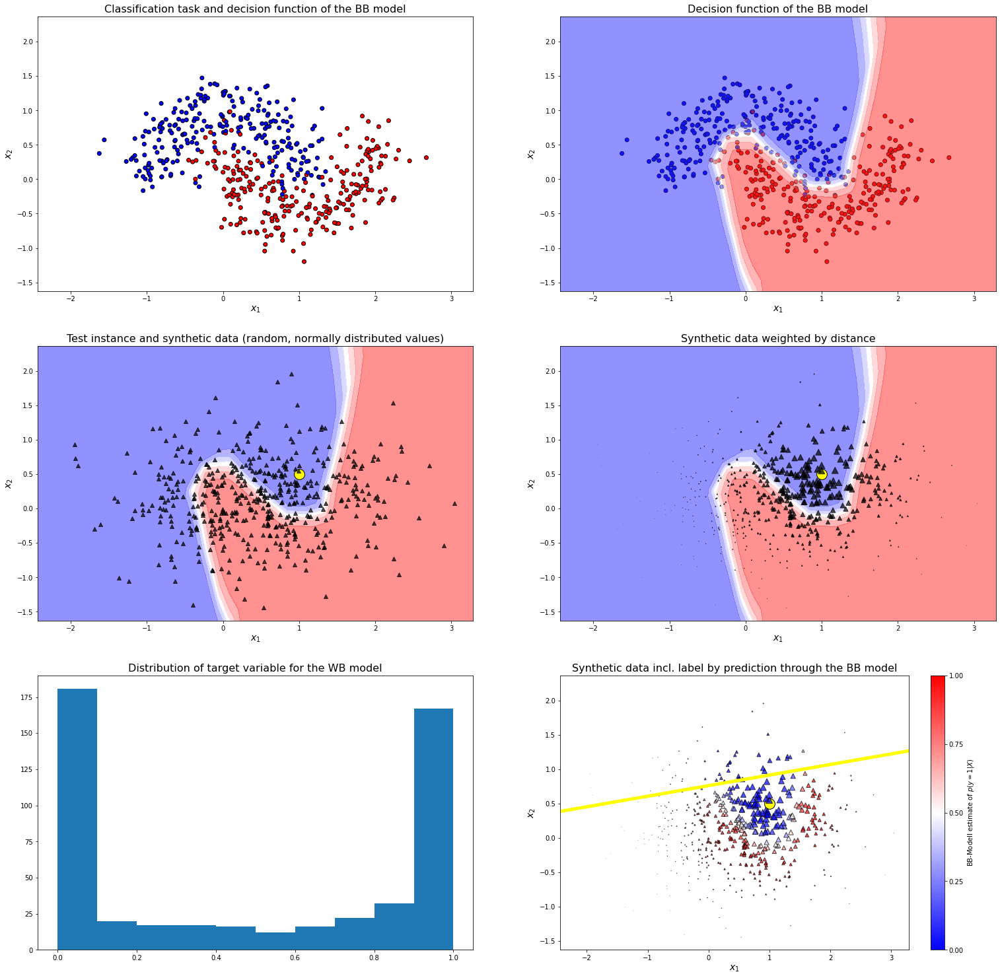

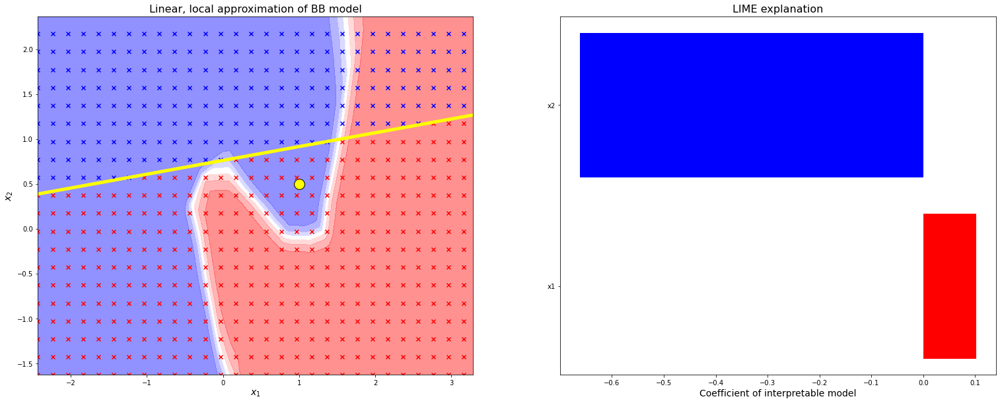

In [93]:
# Original data for the classification task
n_real_data = 500 # Anzahl der Fälle 

# Ripley data set (simple linear classification task)
# X, y = make_Ripley(n=n_real_data, mu1=[0,0], mu2=[3, 3], sig1=2, sig2=1)

# Moon data set (non linear classification task)
X, y = make_moons(n_samples=n_real_data, noise=0.25, random_state=rnd_state)

# Synthetic data for the estimation of the interpretable model
n_syn_data = 500  # Sample size for synthetic data that should get generated by LIME
kernel_width = 0.5 # Parameter \sigma for exponential core function
mean_x = np.mean(X, axis=0) # added 
s_x = np.std(X, axis=0)     # added
np.random_state = rnd_state # added
X_syn = np.random.normal(loc=0, scale=1, size=n_syn_data*2).reshape(n_syn_data, 2) # added
X_syn = X_syn * s_x + mean_x # added

# Non-linear classifiers (BB-Modelle)
#clf = XGBClassifier(learning_rate=0.01, n_estimators=250, random_state=rnd_state)
#clf = MLPClassifier(random_state=rnd_state)
clf = MLPClassifier(hidden_layer_sizes=(100, 25), max_iter=500, random_state=rnd_state)

# Fitting BB model
BB_model = clf.fit(X, y)
y_syn = BB_model.predict_proba(X_syn)[:,1]

# Observation to be explained
test_point = [1, 0.5]#[1.75, 0.75] 
test_point = np.array(test_point).reshape(1, -1)  

xy_limits = plot_get_limits( np.row_stack((X, X_syn))) # added 

LIME_demo(X, y, test_point, BB_model, n_syn_data, kernel_width, rep_paper_plot=False)

### The official LIME package

Next, we will install the [official LIME package](https://github.com/marcotcr/lime). This package, similar to the LIME from scratch above, is based on the paper by [Ribeiro et al. (2016)](https://doi.org/10.1145/2939672.2939778). It currently supports tabular data, textual data and image data. 

In [94]:
# Install and load LIME package (you need to do this only once)
# todo : Some comments on the installation
!pip install lime

In [95]:
# Chose row/ observation and extract values
test_point = 1
observation = X_test[test_point]

In [96]:
import lime
from lime.lime_tabular import LimeTabularExplainer

# Generate LIME explainer function for tabular data
lime_explainer = LimeTabularExplainer(X_train, mode="classification", feature_names=list(X_var_labels), categorical_features=None, verbose=True, discretize_continuous=False)

# Features to show in plot
k=10 

# Prediction of RF model
pred_fun = rf.predict_proba  

# Call explainer function
exp_rf = lime_explainer.explain_instance(data_row=observation, predict_fn=pred_fun, num_features=k)
# Output results
exp_rf.show_in_notebook(show_table=True, show_predicted_value= True)

Intercept 0.21014342119058269
Prediction_local [0.20088304]
Right: 0.5053864455148961


In [97]:
# Repeat for XGB
pred_fun = xgb.predict_proba
exp_xgb = lime_explainer.explain_instance(data_row=X_test[test_point], predict_fn=pred_fun, num_features=k)
exp_xgb.show_in_notebook(show_table=True, show_predicted_value= True)

Intercept 0.11964343525711302
Prediction_local [0.11106625]
Right: 0.6805318


**How to interpret these plots:** <br>
This plot depicts:
- the class probabilities for class 0 (in blue) and class 1 (orange) in the left plot
- the contributions (blue contributes to class 0, orange to class 1) of the features to the prediction corresponding to the weights of the linear model in the central plot.
- the actual values for each feature for the given observation ranked by their importance on the right

*For example*, in the XGB plot the observation we are inspecting had a value of 0.14 for DEBTINC. This value is approximated to have affect the output the most, with a value of 0.07, pushing it towards class 1.

**When to use this plot:** <br>
This model is helpful when we want to take a closer look at a single observation. For example, a person applied for a loan at the bank. We estimate their risk of default to be 0.68 according to our XGB model and 0.51 for our RF model. This is fairly high for the given scenario, so we chose to review this decision. A professional with the given domain knowledge can look at how the features have affected the output and use this plot as a aid for decision-support to make the final decision. For example, as seen in prior, the feature DEBTINC is of high importance. Having a debt-to-income ratio of 0.14 has had a strong positive effect on our output. This is reasonable as the higehr the debt in comparison to the income, the less likely a person might be to pay back their loan. 

## SHAP

Next, we will discuss SHAP values. SHAP values originally stem from game theory. It is an approach that aims to calculate the contribution a player makes to the output. In the setting of data science, our players are the features. This means we want to calculate the contribution each feature has on the final output. A simplified way of describing their calculation: This is done by changing the data slightly, and observing how the output changes and then estimate how high the contribution of each feature is. Using SHAP values for interpretable machine learning is based on [Lundberg & Lee (2017)](https://papers.nips.cc/paper/2017/hash/8a20a8621978632d76c43dfd28b67767-Abstract.html).

As always, we can write functions from scratch or use preexisting functions to apply these techniques. Today, we will be using the official SHAP package [SHAP package](https://github.com/slundberg/shap). If however you are interested in learning how to write this function from scratch, follow [this link](
https://afiodorov.github.io/2019/05/20/shap-values-explained/) for a detailed explanation.

For this particular package, we use a the `shap.TreeExplainer` function for each model and use this to then calculate the shap values. 

In [98]:
# Shap 
!pip install shap
import shap

In [99]:
# Calculate SHAP values for both models
explainer_rf = shap.TreeExplainer(rf)
shap_values_rf = explainer_rf.shap_values(X_test)

explainer_xgb = shap.TreeExplainer(xgb)
shap_values_xgb = explainer_xgb.shap_values(X_test)

# Reshape observation array to make it compatible with SHAP
observation_array = observation.reshape(1, -1)

### SHAP plots

In [100]:
# Random Forest

shap_values_rf_single = explainer_rf.shap_values(observation_array)
shap.initjs()
shap.force_plot(explainer_rf.expected_value[1], shap_values_rf_single[1], observation, feature_names=X_var_labels )

In [101]:
# XGBoost

shap_values_xgb_single = explainer_xgb.shap_values(observation_array)
shap.initjs()
shap.force_plot(explainer_xgb.expected_value, shap_values_xgb_single, observation, feature_names=X_var_labels)

**How to interpret these plots:** <br>
This plot depicts:
- the output: above the scale
- each variable: by name
- their value: the number behind the feature name
- its contribution to the output: size and color of arrow, blue for negative impact, red for positive. The size defines how big their impact is. 
<br>

*For example*, our output for the RF model is 0.51, the feature DEBTINC had a value of 0.1375 in our data set and has the largest negative impact on the final output.

**When to use this plot:** <br>
This model can be used in the same scenario as the LIME plot above. Again, we have a fairly high risk of default for the given scenario and want to review, which features influenced the final prediction and how. We might find some variables did not get ascribed enough weight towards the prediction. We also might find a variable that has a big impact on the final output, but domain knowledge disagrees with this. Therefore, a person can use this plot as decision-support and help them make data-driven decisions. The SHAP plot, similar to the LIME approximation, shows a large positive impact on the risk estimation of this particular observation.

**Additional:**
You might have seen the difference in output for the RF (0.51) and XGB model (0.76) for the shap plots. The RF model outputs a probability, whilst the `shap.TreeExplainer` outputs log-odds for the XGB model. The SHAP values are relative to this output and therefore differ in values.

In [102]:
# RF full plot
shap.initjs()
shap.force_plot(explainer_rf.expected_value[1], shap_values_rf[1], X_test, feature_names=X_var_labels)

In [103]:
# XGB full plot
shap.initjs()
shap.force_plot(explainer_xgb.expected_value, shap_values_xgb, X_test, feature_names= X_var_labels)

**How to interpret these plots:** <br>
This plot shows a summary of the plot shown above for all observations, simply rotated by 90 degrees. The y-axis shows which corresponding observation the horizontal stack of SHAP values refers to. The index of the observations depends on what you chose for the y-axis. The initial selection is "sample order by similarity", meaning observations with similar feature values are close to each other on the y-axis. We can run our mouse over this plot to get the exact corresponding output on the x-axis and the features with the highest absolute shap values.

*For example*, observation 0 shows an output value of 0.9 for the RF model, with the features DEBTINC, DELINQcat_1+, DEROGzero and CLNO had the highest absolute shap values. We can also read their corresponding feature values. 

**When to use this plot:** <br>

This plot can specifically be used to identify relationships and patterns of the model and the decision it makes. It is very useful as you can change what the plot shows by changing the x- and /or y-axis. 
<br>*Change the y-axis to "sample order by output value"* You can see that the blue and red will meet exactly where the output value is, just as we have seen in the first plot. Furthermore, we see a decline of output from 1 to 0 for the RF model for example. Even more instrecting however is looking at specific variables.
<br> *Leave the y-axis as is and change the x-axis to "DEBTINC effect"* We can clearly identify a pattern here, in which many observations with a high risk of defaulting on a loan (towards the left of this plot) show high positive SHAP values for the DEBTINC variable. The lower the risk, the more of a negative impact (lowering the risk) that same variable has had on the decision. 
This plot is very useful for data scientist trying to validate a model with the help of domain knowledge. It is important to note that these are the SHAP values and note related to the feature value. You can use your mouse to hover plot and identify the corresponding feature value.

### Summary Plots


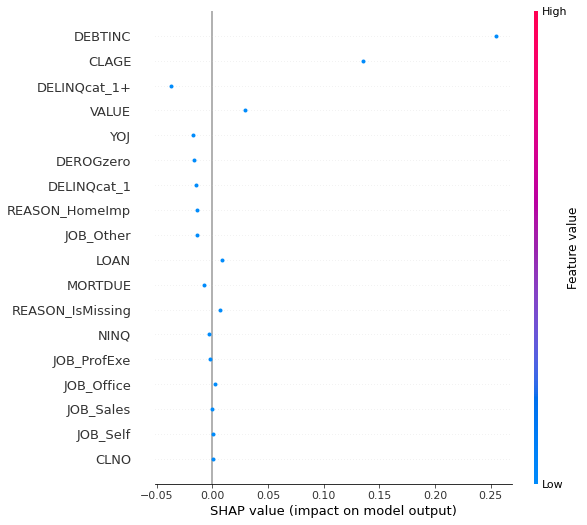

In [104]:
# Make plot for Single Observation of Random Forest
shap.summary_plot(shap_values_rf_single[1], observation_array, feature_names= X_var_labels)


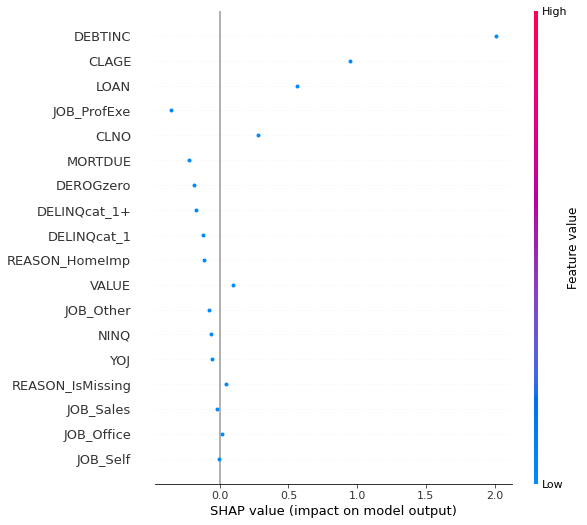

In [105]:
# for XGB
shap.summary_plot(shap_values_xgb_single, observation_array, feature_names=X_var_labels)

**How to interpret these plots:** <br>
This plot depicts:
- Features  are ranked in descending order of their impact
- each feature on y-axis
- a scale of the SHAP values on the x-axis
- the corresponding SHAP value for each feature on the graph
- each point in the plot is color-coded on a scale from blue (low) to red (high) depending on whether or not the value in our data set for this observation and feature was high or low. For a single observation they tend to all be blue, as there is no comparison as to what is high or low. The next plots will make use of this.

The closer a point is to the horizontal line, the less impact it had on the model output.

*For example*, the feature DEBTINC has a high SHAP value, around +0.25 for the RF model and around 2 for the XGB model. Remember, you cannot compare the SHAP values of both models to each other based on the difference in their prediction. 

**When to use this plot:** <br>
We would use this plot in the same setting as above. It gives us more insight on the SHAP values and just a different type of visualization. It focuses less on the actual value a feature had in the data. Instead, we can get a better idea of the actual SHAP values. This plot might be more suitable for a data analyst, or someone who has a better understanding of what the SHAP values mean, whilst the prior one is explicitly easy to understand for people without much knowledge in this field. 


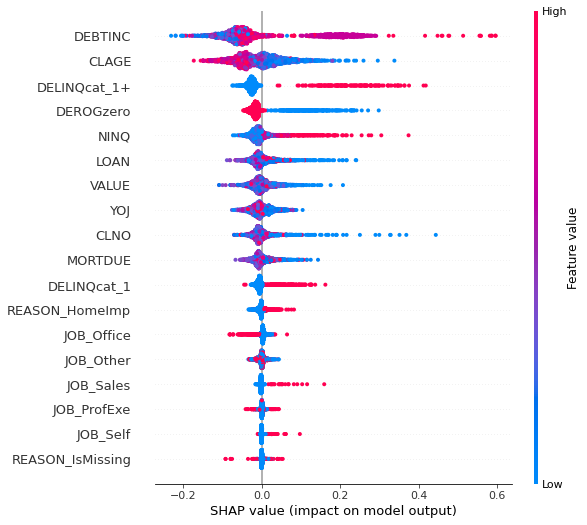

In [106]:
# Summary plot for whole RF not single obsrvation
shap.summary_plot(shap_values_rf[1], X_test, feature_names=X_var_labels)

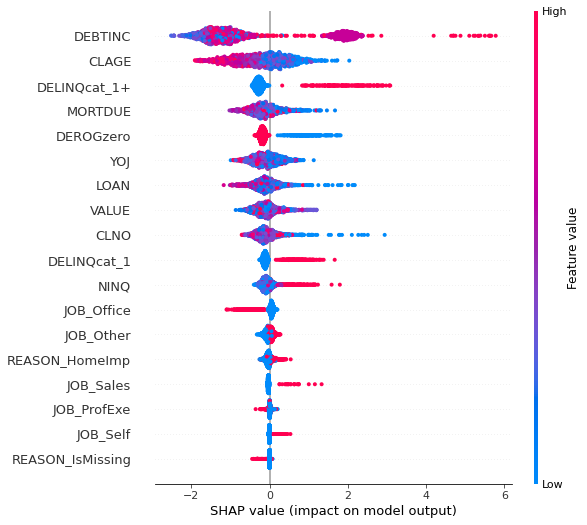

In [107]:
# for whole XGB not single obsrvation
shap.summary_plot(shap_values_xgb, X_test, feature_names=X_var_labels)

**How to interpret these plots:** <br>
This plot is a summary of the plot above for all observations. So the only difference is, that instead of inspecting one observation, we can identify how the whole model classifies cases. This means that we move from a local to a global perspective. The features are sorted by their sum of SHAP values across all samples. Also note that this is a densitity scatter plot, so we can identify which SHAP values were common and whether or not that SHAP value is more likely to correspond with a high or low feature value. 

*For example*, the feature DEROGzero which is one for all observations that do not have major derogatory reports. If this is true for an observation, the value is 1, if not, the value is 0. Therefore blue dots depict observations with major derogatory reports and red dots the one that do not have any. Not having any slightly lowers the risk of default according to the SHAP plots of both models. If DEROGzero is false, the risk can increase up to about 25% for the RF model. 


**When to use this plot:** <br>
We would use this plot to validate the model overall. It is used to get an idea of how the model comes to its decision and if these agree with domain knowledge. Use the example mentioned above. It makes sense, that people without late payments have a lower risk of default. We can see that the SHAP values for high/positive values for DEROGzero (1) are quite dense, so similar across many observations. However, people that have had major derogatory reports in the past are more likely to default. Here we see that the SHAP values are less dense, meaning they vary a lot more. This can be explained because SHAP values are calculated depending on the different feature values for an observation and are therefore relative on these other values. However, instinctively, this seems to agree with domain knowledge. This is how you could validate or invalidate models decisions and decide if they are trust worthy.

## Conclusion

Well done! You have reached the end of this tutorial. We hope that this tutorial has shown you some insight on possible ways to visualise your model's decisions and find ways to understand their decisions, even if they are complex. For your documentation, as always, we added a table summarising the functions we made use of today. 


| Method | Possible Function | Package to be imported (if applicable) | 
| --- | --- | --- |
| feature importance| `some_model.feature_importance_` | Skitlearn |
| permutation-based feature importance | `permutation_importance()` | ` from sklearn.inspection import  permutation_importance`|
| partial dependence plot| `partial_depedence_plot()` | `from sklearn.inspection import plot_partial_dependence ` |
| **LIME**| | ` import lime`|
| LIME tabular explainer | `LimeTabularExplainer()` | ` from lime.lime_tabular import LimeTabularExplainer` |
| LIME plot |`some_LIME_explainer.show_in_notebook()`| |
| **SHAP** | | ` import shap` |
| SHAP explainer| `shap.TreeExplainer()` | |
| Calculate SHAP values| `some_SHAP_explainer.shap_values()`|  |
| SHAP force plot |`shap.force_plot()`| |
| SHAP summary plot| `shap.summary_plot()` | |
